<a href="https://colab.research.google.com/github/DavidBrainerd/Dog-Breed-Identification/blob/main/Dog_Breed_Identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end multi-class dog breed classification

In this notebook we are going to build an end-to-end multi-class dog breed image classifier using TensorFlow 2.x and TensorFlow Hub

## Problem

Identify the breed of a dog given the photo of the dog.
We want to be able to know what particular breed a dog is just by taking a photo of the dog. 

## Data

The data is from the kaggle Dog Breed Identification competition.
The link to the data is https://www.kaggle.com/c/dog-breed-identification/data

## Evaluation

The evaluation is a file submission of prediction probabilities for the different dog breeds for each image in the test set.
The kaggle evaluation link is: https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## Features

This is where we will get information or details about the data we are working with. 

* We are working with images (unstructured data), so we will be using Deap Learning or Transfer Learning algorithms.
* There are 120 breeds of dogs, which also tells us that there are 120 different classes.
* There are about 10,000 plus images in the test set. These images all have labels that correspond to the type of breed in the image.
* There are also about 10,000+ images in the training set. These images have no labels, because we'll have to predict them.

## Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow hub
* Make sure that we are using a GPU

In [1]:
# import necessary tools

import tensorflow as tf
import tensorflow_hub as hub
print('TensorFlow Version:', tf.__version__)
print('TensorFlow Hub Version:', hub.__version__)

# check for GPU availability
print('GPU is available' if tf.config.list_physical_devices('GPU') else 'GPU is not available')

TensorFlow Version: 2.6.0
TensorFlow Hub Version: 0.12.0
GPU is available


## Getting data ready (Turning data into tensors) and doing some exploitory data analysis

In [2]:
# check out the labels of our data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/labels.csv')

In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [4]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,4881c807c3eb2294f762088eb80aa5ca,scottish_deerhound
freq,1,126


In [5]:
# find out how many images of each breed are available (how many images are available per class)
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
brabancon_griffon        67
golden_retriever         67
komondor                 67
briard                   66
eskimo_dog               66
Name: breed, Length: 120, dtype: int64

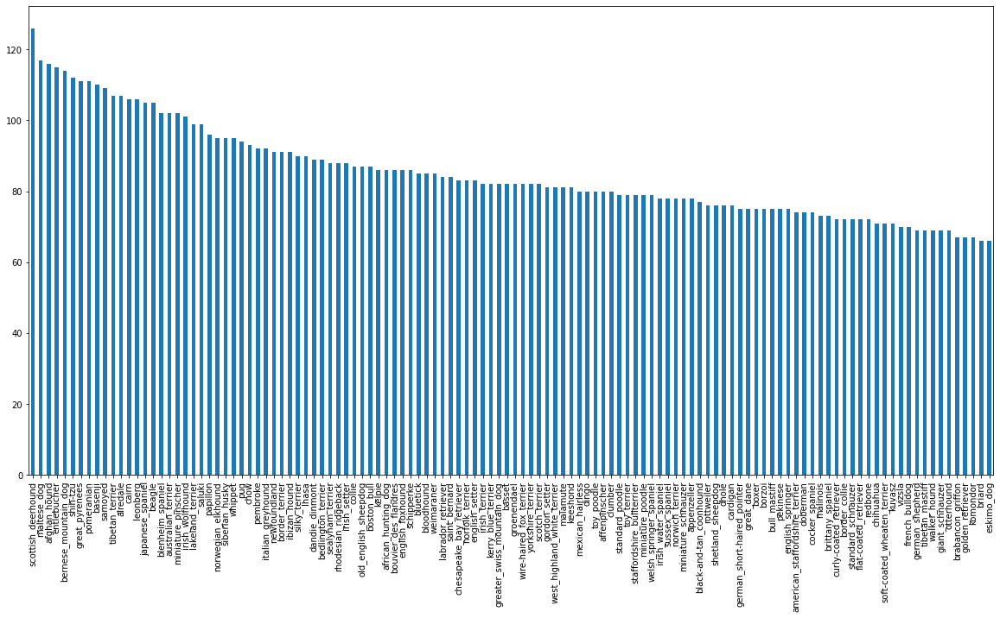

In [6]:
# bar plot for number of images available for each breed
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10));

In [7]:
# finding our average number of images are available per class
print('There are', labels_csv['breed'].value_counts().median(), 'number of images available per class')

There are 82.0 number of images available per class


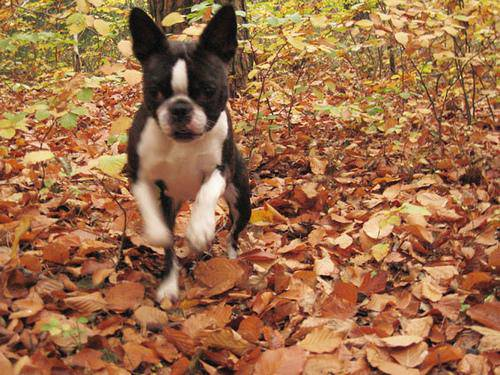

In [8]:
# Let's view an image
from IPython.display import Image
Image('/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

### Getting images in the train folder and their labels

Let's make a list of all image filepath names

In [9]:
# create list of pathnames using image ID's

filepaths = ['/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/' + filename for filename in labels_csv['id'] + '.jpg']
filepaths[:5]

['/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [10]:
# checking to see if number of image files match the number of file names in label.csv

import os
len(os.listdir('/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train')) == len(filepaths)


True

In [11]:
os.listdir('/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train')[:10]

['df12a66b9b154c8bbe922846944e2ef2.jpg',
 'dcc865c3a438f9d0f8588dd7d1e0aa09.jpg',
 'db953c4fb2ef6767dd6c817574b4e447.jpg',
 'e655b500159688691e025a1177936df0.jpg',
 'e91b2802897234af87d09702a6b23b16.jpg',
 'e8e9ea1506e0ad9382665b2690ecb4e9.jpg',
 'e7678fac0b8f1d97e742644ee75a8aa2.jpg',
 'e87a86f29c8709e81bbea9c8139d739c.jpg',
 'e6e89b7a7579de5c5ced94253491953e.jpg',
 'e57ca37ac086752c46e40a90139f9b26.jpg']

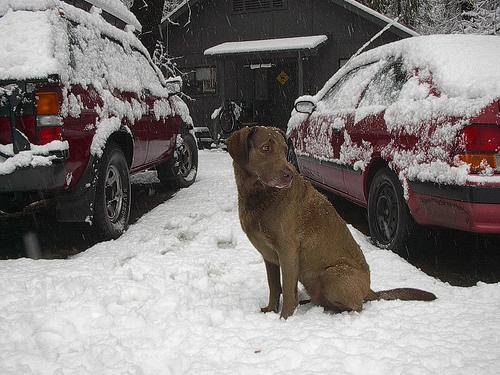

In [12]:
# one more random check
Image(filepaths[10221])

In [13]:
labels_csv['breed'][10221]

'chesapeake_bay_retriever'

After putting the training image filepaths in a list, let's prepare the labels.

In [14]:
import numpy as np
labels = np.array(labels_csv['breed'])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# checking to see if number of labels match the number of filenames in label.csv
len(labels) == len(filepaths)

True

In [17]:
# find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [18]:
len(unique_breeds)

120

## Turning data labels into numbers

In [19]:
# turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
# now turn all labels into an array of booleans
boolean_labels = [label == unique_breeds for label in labels]

In [21]:
boolean_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Now we are going to turn the boolean arrays into numbers (integers)

In [22]:
# Example: turning a boolean array into an integer
print(labels[7]) # name of the selected label
print(np.where(labels[7] == unique_breeds)) # index position where the label occurs 
print(boolean_labels[7].argmax()) # index position where label occurs in boolean array
print(boolean_labels[7].astype(int)) # there will be a 1 where the sample label occurs in the array

borzoi
(array([18]),)
18
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating a validation set

In [23]:
# Set up X and y variables
X = filepaths
y = boolean_labels

### Starting off experimenting with a portion of the data (1000 images in this case) and then increasing as needed. This is in order to minimize time between experiments.

In [24]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [25]:
# Now split data into training and validation sets of total size NUM_IMAGES
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 25)

In [26]:
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [27]:
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/1880c57a7ac87a232158207581c989df.jpg',
  '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/0ab12906ac3a87b531c574a15e79c58a.jpg',
  '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/0f8e8464cfa3bacc074d6e0289d6657f.jpg',
  '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/17f15b80ab3238f1fbe5961286db0eba.jpg',
  '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/train/02f6152a9401568d695234d33bb6c37d.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fals

## Preprocessing images (turning images into Tensors)
To preprocess out images into tensors, we are going to create a function which does a few things:
* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable (we'll call the variable `image`, and the files will be in jpg format).
* Turn `image` into tensors
* Normalize image (convert color channel value range from 0-255 to 0-1)
* Resize images so that they all have the same size (in this case we'll resize our images to size 224, 224)
* Return modified `image`

Before we start to create the function, let's see what importing an image looks like.

In [28]:
# convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filepaths[25])
image.shape

(375, 500, 3)

In [29]:
tf.constant(image)[:3]

<tf.Tensor: shape=(3, 500, 3), dtype=uint8, numpy=
array([[[158,  67,  84],
        [126,  50,  63],
        [121,  68,  74],
        ...,
        [220, 237, 245],
        [221, 238, 246],
        [222, 239, 247]],

       [[154,  63,  80],
        [134,  56,  70],
        [126,  71,  77],
        ...,
        [225, 242, 250],
        [226, 243, 251],
        [227, 244, 252]],

       [[156,  62,  80],
        [148,  68,  81],
        [133,  76,  83],
        ...,
        [225, 244, 251],
        [227, 246, 253],
        [229, 248, 255]]], dtype=uint8)>

In [30]:
image[:3]

array([[[158,  67,  84],
        [126,  50,  63],
        [121,  68,  74],
        ...,
        [220, 237, 245],
        [221, 238, 246],
        [222, 239, 247]],

       [[154,  63,  80],
        [134,  56,  70],
        [126,  71,  77],
        ...,
        [225, 242, 250],
        [226, 243, 251],
        [227, 244, 252]],

       [[156,  62,  80],
        [148,  68,  81],
        [133,  76,  83],
        ...,
        [225, 244, 251],
        [227, 246, 253],
        [229, 248, 255]]], dtype=uint8)

Now lets create the function with the following steps:
* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable (we'll call the variable image, and the files will be in jpg format).
* Turn image into tensors
* Normalize image (convert color channel value range from 0-255 to 0-1)
* Resize images so that they all have the same size (in this case we'll resize our images to size 224, 224)
* Return modified image

In [31]:
# Now let's create the function

# Define image size
IMG_SIZE = 224

# create function to preprocess images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image filepath and then turns it into a tensor
  """
  # Read in an image file (image file path as input)
  image = tf.io.read_file(image_path) # returns a tensor in the form of a string with the file contents

  # Turn jpeg image into numerical tensor with 3 color channels (red, greed, blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # convert the color channel range of values from 0 - 255 to 0 - 1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize images so that they all have the same size
  image = tf.image.resize(images = image, size = [IMG_SIZE, IMG_SIZE])

  # Return modified images
  return image

### Turning data into batches of size 32

In order to use TensorFlow effectively, we are going to put our data in the form of Tensor tuples, which look like this: `(image, label)`

In [32]:
# create a function to return a tensor tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image filepath and the associated label, processes the image, and the returns a tuple of (image, label)
  """
  return process_image(image_path), label

In [33]:
# Example of above function
process_image(X[91]), tf.constant(y[91])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.32464135, 0.33728945, 0.32127956],
         [0.3483106 , 0.3719713 , 0.35811454],
         [0.344455  , 0.36349383, 0.36747554],
         ...,
         [0.39045224, 0.38587937, 0.3338736 ],
         [0.38324973, 0.42817283, 0.41486764],
         [0.6936102 , 0.74851215, 0.74851215]],
 
        [[0.3817234 , 0.3943547 , 0.3441884 ],
         [0.37102595, 0.40453437, 0.33966666],
         [0.37137255, 0.40446433, 0.33143207],
         ...,
         [0.44026798, 0.440275  , 0.44071975],
         [0.47139242, 0.5129521 , 0.5170222 ],
         [0.732188  , 0.78709   , 0.7910116 ]],
 
        [[0.36504087, 0.3620133 , 0.38001576],
         [0.37010863, 0.39596295, 0.36802348],
         [0.38211665, 0.41326457, 0.3523926 ],
         ...,
         [0.39286017, 0.39843318, 0.46740782],
         [0.5704442 , 0.6109941 , 0.6381543 ],
         [0.7550168 , 0.80991876, 0.819215  ]],
 
        ...,
 
        [[0.05159855, 0.26842257

After figuring out a way to turn our data into tuples of tensors of the form `(image, label)`, let's make a function to turn all of our data into batches.

In [34]:
# Define batch size, 32 is a good start
BATCH_SIZE = 32

# create function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates data batches out of image(X) and label(y) pairs. 
  Shuffles the data if its a training data, but doesn't not shuffle the data if it's a validation data.
  Accepts test data as input (test data have no labels)
  """

  # If the data is a test dataset, there will be no labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE) # turning data into a batch
    return data_batch

  # If the data is a validation dataset, do not shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    # Turning filepaths and labels into tensor 
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # for filepaths
                                              tf.constant(y))) # for labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # SHuffle data if its a training data
  else:
    print('Creating training data batches...')  
    # Turning filepaths and labels into tensor
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y))) 
    # Shuffle pathnames and labels before mapping image processor function because it's faster than shuffling images
    # takes longer to shuffle images than filenames, so we have to minimize time between experiments  
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples using the get_image_label function, which also turns the filepaths into processed images using the process_image function
    data = data.map(get_image_label)
    # Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [35]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [36]:
# Checking out the different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
We now have our data in batches, but this can be kinda hard to understand them. So, let's visualize our data batches.

In [37]:
import matplotlib.pyplot as plt

# create function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # set up the figure
  plt.figure(figsize=(10, 10))
  # loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots (5 rows and 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn grid lines off
    plt.axis('off')

In [38]:
unique_breeds[y[10].argmax()]

'shetland_sheepdog'

Now because our data is in the form of a batch, we need to unbatch the data before we can visualize it.

In [39]:
# Unbatch train data by turning it into an iterator

train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.38132286, 0.34365386, 0.26339975],
          [0.25194016, 0.2305466 , 0.14486732],
          [0.4200094 , 0.43455487, 0.33708605],
          ...,
          [0.28170517, 0.29739144, 0.24217439],
          [0.29300863, 0.3204596 , 0.2577145 ],
          [0.283806  , 0.31125697, 0.24851187]],
 
         [[0.35156283, 0.30620748, 0.22888514],
          [0.2703458 , 0.24650204, 0.16082276],
          [0.4068471 , 0.41017345, 0.31565765],
          ...,
          [0.27585784, 0.2915441 , 0.23632705],
          [0.28382352, 0.3112745 , 0.24852939],
          [0.27507   , 0.302521  , 0.23977587]],
 
         [[0.32666773, 0.27089038, 0.19672339],
          [0.2927093 , 0.257008  , 0.17614312],
          [0.40633553, 0.39547947, 0.30593285],
          ...,
          [0.28382358, 0.29590338, 0.2515057 ],
          [0.28400314, 0.30812782, 0.25203532],
          [0.2747899 , 0.30224088, 0.23949575]],
 
         ...,
 
         [[0.54705334, 0.48038667, 0.41764158],
          [0.52492

In [40]:
len(train_images), len(train_labels)

(32, 32)

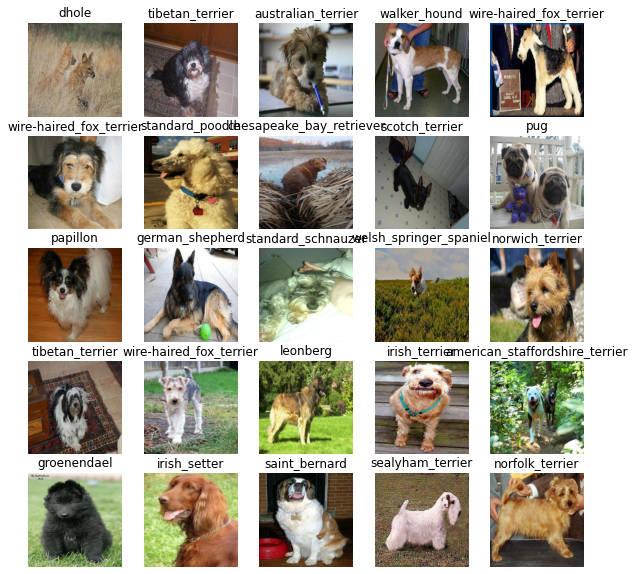

In [41]:
# Now let's visualize the data in our training batch
show_25_images(train_images, train_labels)

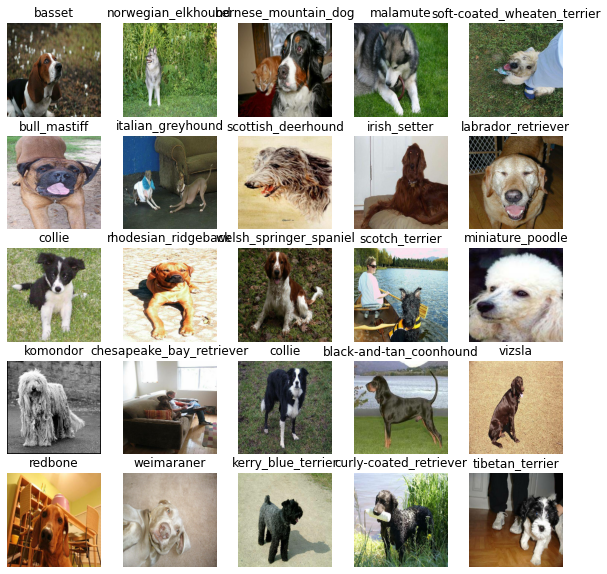

In [42]:
# Now let's visualize the data in our validation batch

# Unbatch valid data by turning it into an iterator
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25_images(valid_images, valid_labels)

## Building a model
Before we build a model, there are a few things we need to define:
- The input shape (shape of our images, in the form of tensors) to our model.
- The output shape (image labels, in the form of tensors) of our model.
- The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5.

In [43]:
# Set up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch size, height, width, number of color channels

# Set up output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Set up model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5'

Now that we've got our inputs, outputs, and model ready, let's put them all together into a `keras deep learning model`.
Therefore, we are going to create a function that does the following:
- Takes the input shape, the output shape, and the chosen model as parameters
- Defines the layers in a keras model in sequential fashion (sequential fashion implies do this first, then this, then that).
- Compiles the model (says how it should be evaluated and improved).
- Builds the model (tells the model the input shape it will be getting).
- Returns the model.

An explanation or understanding of all these steps can be found here: https://www.tensorflow.org/api_docs/python/tf/keras

In [44]:
# Create function which builds keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Set up the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), # Layer 1 (input later)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE) # batch input shape

  return model

In [45]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5508713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,628,953
Trainable params: 120,240
Non-trainable params: 5,508,713
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress, or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

In order to set up a TensorBoard callback we need to do three things:
- Load the TensorBoard notebook extension.
- Create a TensorBoard callback which is able to save logs (logs are how well our model is doing during training) to a directory, and pass it to our model's `fit()` function.
- Visualize our model's training logs with the `%tensorboard` magic function (we will do this after model training).

In [46]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [47]:
import datetime

# Create a function to build a TensorBoard callback

def create_tensorboard_callback():

  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join(
      '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/logs',
      # add datetime so that the logs get tracked whenever we run an experiment
      datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
  )
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
Early stopping callback helps to stop our model from overfitting by stopping training if a certain evaluation metric stopd improving.

See the following link for more on early stopping callbacks: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [48]:
# Create early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model
Our model is only going on train on 1000 images for a start in order to make sure that everything is working (so that we are not wasting time training a lot more images) and to save time between experiments.

In [49]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [50]:
# Check again to make sure that we are still running on a GPU
print('GPU is still running' if tf.config.list_physical_devices('GPU') else 'GPU is currently not available')

GPU is still running


### Let's create a function which trains our model
The function will be able to do the following:
- Create a model using `create_model()`
- Set up a TensorBoard Callback using `create_tensorboard_callback()` (Create new TensorBoard session everytime we train a model)
- Call the `fit()` function on our model, passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`), and the callbacks we would like to use.
- Return trained model

In [51]:
# Build function to train and return trained model
def train_model():
    """
    Trains a given model and then returns the trained model
    """
    # create a model
    model = create_model()

    # Create new TensorBoard session everytime we train a model
    tensorboard = create_tensorboard_callback()

    # Fit model to data and pass it the callbacks we created
    model.fit(
        x=train_data,
        epochs=NUM_EPOCHS,
        validation_data=valid_data,
        validation_freq=1,
        callbacks=[tensorboard, early_stopping]
    )
    return model

In [52]:
# Fit model to data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
Epoch 1/100
25/25 [==============================] - 138s 4s/step - loss: 4.5198 - accuracy: 0.0875 - val_loss: 3.5364 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 5s 184ms/step - loss: 1.6898 - accuracy: 0.7050 - val_loss: 2.2678 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 4s 165ms/step - loss: 0.5777 - accuracy: 0.9337 - val_loss: 1.7770 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 5s 183ms/step - loss: 0.2481 - accuracy: 0.9850 - val_loss: 1.5674 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 5s 187ms/step - loss: 0.1428 - accuracy: 0.9987 - val_loss: 1.4845 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 162ms/step - loss: 0.0986 - accuracy: 1.0000 - val_loss: 1.4324 - val_accuracy: 0.6600
Epoch 7/100
25/25 [=========================

#### From the results above it seems our model is overfitting, because it is performing way better on the traning set than on the validation set. Therefore, our model has poor `Generalization`, and we have to look into fixing that issue and avoid any overfitting.

### Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize it's content so that we can see how well our model is performing. 

In [53]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Breed\ Identification/dog-breed-identification/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [54]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [55]:
predictions = model.predict(valid_data, verbose=1)

7/7 [==============================] - 2s 125ms/step


In [56]:
predictions

array([[1.03964558e-04, 2.55425548e-04, 4.90165490e-04, ...,
        4.14160895e-04, 8.69422161e-04, 7.65045930e-04],
       [2.61701149e-04, 1.33876010e-05, 5.73356287e-04, ...,
        8.70466465e-04, 6.33069503e-05, 7.17906778e-06],
       [7.22016412e-05, 2.24143127e-03, 1.00902020e-04, ...,
        1.04455066e-04, 1.13558788e-04, 6.81148449e-05],
       ...,
       [6.38475874e-04, 1.67730919e-04, 2.32367183e-05, ...,
        1.39202096e-03, 1.32313641e-02, 5.08968136e-04],
       [9.27518777e-05, 4.42973716e-04, 9.73240414e-04, ...,
        7.27439416e-04, 1.13408125e-04, 2.49554978e-05],
       [7.23481789e-05, 5.47056734e-05, 2.79046159e-04, ...,
        3.59613259e-05, 1.89306736e-02, 7.88407269e-05]], dtype=float32)

In [57]:
predictions.shape

(200, 120)

In [58]:
len(y_val)

200

In [59]:
len(unique_breeds)

120

In [60]:
sum(predictions[0])

0.9999999043611751

In [61]:
# Trying for the first prediction
index = 0
print(predictions[index], '\n')
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[1.03964558e-04 2.55425548e-04 4.90165490e-04 1.69810810e-04
 3.51128937e-03 2.34386724e-04 1.76673333e-04 2.36098608e-03
 8.02999020e-01 2.36311257e-02 2.74237595e-04 1.83221637e-04
 2.04143790e-03 1.72366295e-03 3.20594129e-03 1.34068588e-02
 7.32329354e-05 1.22568177e-04 1.97495232e-04 3.11342388e-04
 1.16261683e-04 1.66157866e-03 5.25077958e-05 2.83011934e-04
 4.65803925e-04 1.15147428e-04 6.86688145e-05 7.92105682e-04
 2.23184848e-04 1.06659230e-04 1.97336529e-04 6.11157957e-05
 2.80524720e-04 1.62219207e-04 4.09715758e-05 3.93927592e-04
 7.31888795e-05 1.11635437e-03 1.84862802e-05 2.91903690e-03
 3.99954792e-04 1.18087126e-04 1.92053360e-03 3.75252566e-04
 4.69764491e-04 9.26559223e-05 7.37546070e-05 1.65920967e-04
 1.46124949e-04 2.28834702e-04 4.33722627e-04 1.14163233e-03
 2.17495603e-04 1.32251624e-03 1.17326170e-04 1.48188061e-04
 7.78745802e-04 6.56714721e-04 5.05759206e-04 2.13664476e-04
 7.44455145e-04 8.79687839e-04 9.38125158e-05 3.20237486e-05
 7.90769773e-05 5.324248

- Having the above funtionality is greate, but we want to be able to do it at scale.
- It would also be better if we could see the image that the prediction is being made on. So, we'll create a function to handle the above tasks.
- *Note*: prediction probabilities are also known as confidence levels.

In [62]:
# Turn prediction probabilities into their respective label (so that it's easier to read / understand)

def get_pred_label(prediction_probabilities):
    """
    Transforms an array of predicted probabilities into a label
    """
    return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of predicted probabilities
pred_label = get_pred_label(predictions[25])

In [63]:
pred_label

'scottish_deerhound'

Since our validation data is still in a batch dataset, we will have to unbatch it in order to make predictions on the validation images and then compare the predictions to the validation labels (truth labels).*italicized text*

In [64]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [65]:
# Create a function to unbatch a batch dataset
def unbatcher(data):
    """
    Takes a batched dataset of (image, label) Tensors and returns it unbatched (separate arrays of images and labels).
    """
    images = []
    labels = []

    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])
    return images, labels

# Unbatch the validation dataset
valid_images, valid_labels = unbatcher(valid_data)

In [66]:
valid_images[0], valid_labels[0]

(array([[[0.16958901, 0.17351058, 0.14998117],
         [0.13335562, 0.13727719, 0.11374777],
         [0.12422094, 0.1281425 , 0.1046131 ],
         ...,
         [0.21654418, 0.21262261, 0.14012611],
         [0.20275737, 0.21119578, 0.11500265],
         [0.19769648, 0.20946118, 0.10284616]],
 
        [[0.17468965, 0.17861122, 0.149357  ],
         [0.12258083, 0.1265024 , 0.0972482 ],
         [0.11885114, 0.12277271, 0.0935185 ],
         ...,
         [0.2548456 , 0.25092402, 0.16963023],
         [0.2464286 , 0.24914221, 0.1463234 ],
         [0.24536942, 0.24964592, 0.13679087]],
 
        [[0.18138796, 0.18753292, 0.14354657],
         [0.12389074, 0.1300357 , 0.08604934],
         [0.12729342, 0.1334384 , 0.08945204],
         ...,
         [0.28465334, 0.28465334, 0.18664557],
         [0.26542127, 0.26934284, 0.14620095],
         [0.27241778, 0.27633935, 0.14915097]],
 
        ...,
 
        [[0.0838678 , 0.06634784, 0.04328481],
         [0.5190348 , 0.5053144 , 0.48485

#### Now that we have figured out ways to get:
- Prediction labels
- Validation labels (truth labels)
- Validation images

Let's create a function to make all this a bit more visual.

We'll create a function that:
- Takes an array of prediction probabilities, an array of truth labels, and an array of images and an integer.
- Convert the prediction probabilities to a predicted label.
- Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot.

In [67]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    Displays the prediction, ground truth, and image for sample n.
    """

    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the prediction label
    pred_label = get_pred_label(pred_prob)

    # Plot image and remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the color of the title depending on whether the prediction is right or wrong
    if pred_label == true_label:
        color = 'green'
    else:
        color = 'red'

    # Change plot title to be predicted, probability of prediction, and truth label
    plt.title("{} {:2.0f}% {}".format(
        pred_label,
        np.max(pred_prob)*100,
        true_label),
        color=color
        )

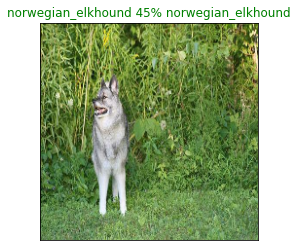

In [68]:
plot_pred(prediction_probabilities=predictions, labels=valid_labels, images=valid_images)

Now we've got a function to visualize our models top prediction, let's make another to view our models top ten predictions.

The function will be able to do the following:
- Take an input of prediction probabilities array, a ground truth array, and an integer.
- Find the prediction using the `get_pred_label()` function.
- Find the top 10:
       Prediction probabilities indexes
       Prediction probabilities values
       Prediction labels
- Plot the top 10 prediction probability values and labels, coloring the true label green.

In [69]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plots the top 10 highest prediction confidences along with the truth label for sample n.
    """

    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the prediction label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes (in descending order)
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color='grey')
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation='vertical')
    # Change color of true labels
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
    else:
        pass

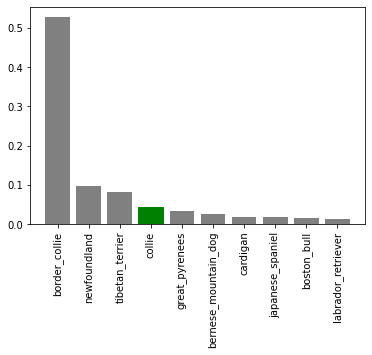

In [70]:
plot_pred_conf(prediction_probabilities=predictions, labels=valid_labels, n=17)

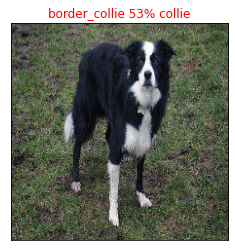

In [71]:
plot_pred(prediction_probabilities=predictions, labels=valid_labels, images=valid_images, n=17)

In [72]:
valid_labels[17]

'collie'

Now that we've got a function to help us visualize and evaluate our model, lets check our a few more visualizations.

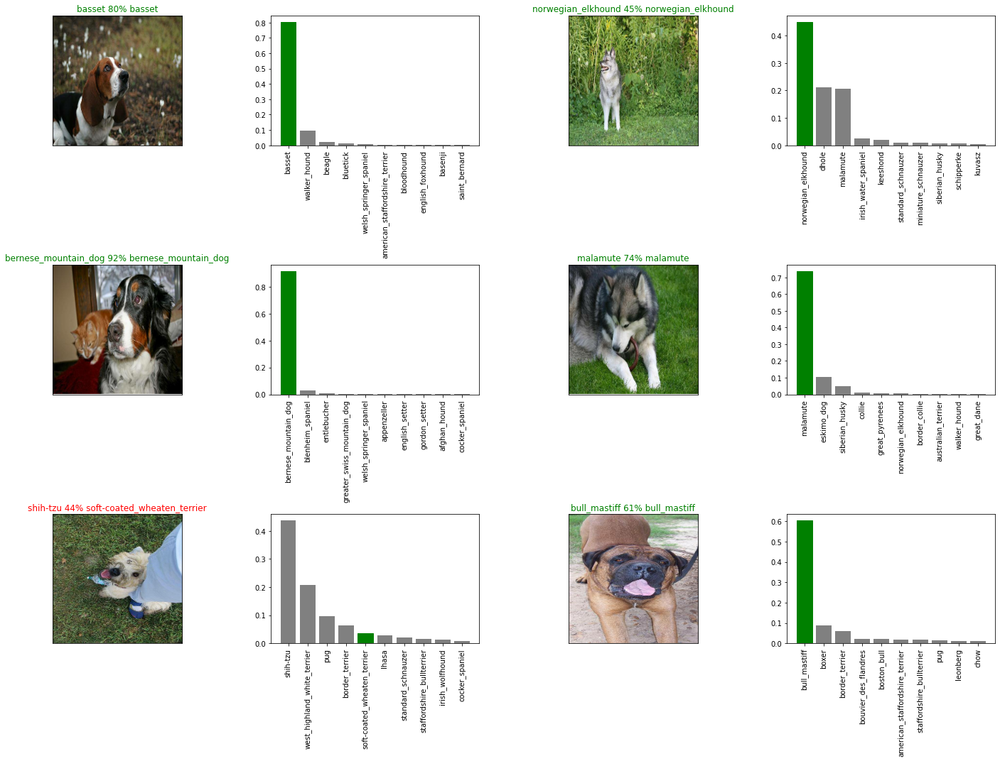

In [73]:
# Checking out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              labels=valid_labels,
              images=valid_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=valid_labels,
                   n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show() 

## Saving and reloading our trained model

In [74]:
# Create a function to save a model
def save_model(model, suffix=None):
    """
    Saves a given model in a model directory and appends a suffix (string).
    """
    # Create a model directory pathname with current time
    modeldir = os.path.join('/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/models',
                            datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
    model_path = modeldir + '-' + suffix + '.h5' # save format of model
    print(f'Saving model to: {model_path}...')
    model.save(model_path)
    return model_path

In [75]:
# Create function to load trained model
def load_model(model_path):
    """
    Loads a saved model from a specified model.
    """
    print(f'Loading saved model from: {model_path}')
    model = tf.keras.models.load_model(model_path,
                                       custom_objects={'KerasLayer':hub.KerasLayer})
    return model

Now we've got functions to save and load a trained model, let's try them out and make sure they work.

In [76]:
# Save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv3-Adam')

Saving model to: /content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/models/20210927-16581632761921-1000-images-mobilenetv3-Adam.h5...


'/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/models/20210927-16581632761921-1000-images-mobilenetv3-Adam.h5'

In [77]:
# Load the saved model
loaded_1000_image_saved_model = load_model('/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/models/20210922-21131632345202-1000-images-mobilenetv3-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/models/20210922-21131632345202-1000-images-mobilenetv3-Adam.h5


In [78]:
# Evaluate the pre-saved model
model.evaluate(valid_data)

7/7 [==============================] - 1s 119ms/step - loss: 1.3476 - accuracy: 0.6550


[1.3475651741027832, 0.6549999713897705]

In [79]:
# Evaluate the loaded model
loaded_1000_image_saved_model.evaluate(valid_data)

7/7 [==============================] - 2s 114ms/step - loss: 1.2664 - accuracy: 0.6400


[1.2664077281951904, 0.6399999856948853]

## Training model on full dataset

In [80]:
# Create a data batch with the full dataset using the create data batch function
full_data = create_data_batches(X, y)

Creating training data batches...


In [81]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [82]:
# Create a model for full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5


In [83]:
# Create callbacks for full model
full_model_tensorboard = create_tensorboard_callback()

# There is no validation set when training model on full datatset, se we can't monitor validation accuracy (val_accuracy)
full_model_earlystopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

Running the cell below to fit the model to the full dataset will take a little while (maybe up to 30 minutes for the first epoch), because the GPU we are using in the runtime has to load all of the images to memory into memory.

In [84]:
# Fit full model to full dataset
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_earlystopping])

Epoch 1/100
320/320 [==============================] - 1060s 3s/step - loss: 1.3555 - accuracy: 0.6716
Epoch 2/100
320/320 [==============================] - 42s 131ms/step - loss: 0.3894 - accuracy: 0.8841
Epoch 3/100
320/320 [==============================] - 42s 130ms/step - loss: 0.2229 - accuracy: 0.9382
Epoch 4/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1392 - accuracy: 0.9695
Epoch 5/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0958 - accuracy: 0.9820
Epoch 6/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0679 - accuracy: 0.9903
Epoch 7/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0511 - accuracy: 0.9946
Epoch 8/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0397 - accuracy: 0.9970
Epoch 9/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0327 - accuracy: 0.9976
Epoch 10/100
320/320 [==============================] - 42s 131ms

In [85]:
# Save our model trained on full dataset
save_model(full_model, suffix = 'full-dataset-images-mobilenetv3-Adam')

Saving model to: /content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/models/20210927-17371632764235-full-dataset-images-mobilenetv3-Adam.h5...


'/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/models/20210927-17371632764235-full-dataset-images-mobilenetv3-Adam.h5'

In [93]:
# Load the save model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/models/20210927-17371632764235-full-dataset-images-mobilenetv3-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/models/20210927-17371632764235-full-dataset-images-mobilenetv3-Adam.h5


After traning our model on the full dataset, we can now use our model to make predictions on the test data. 

Now, we will do something more interesting. Our main goal of the project is to be able to use the photo of a dog, maybe any random dog you see somewhere or a picture of a dog you find on the internet and you are curious about finding out what breed the dog is, you can pass a picture of the dog unto our model so that our model will tell us what breed the dog is.

Therefore, we will now use some custom images to make predictions using our model. We will pass our own dog images unto our model and see how well our model can predict what breed the dogs in the pictures are.

## Making predictions on custom images

In order to make predictions on some custom images, we will:
- Get the filepaths of the custom images.
- Turn the filepaths into data batches using our `create_data_batches()` function, and since our custom images don't have labels we'll set the `test_data` parameter to `True`
- Pass the custom image data batches to our model's `predict()` method (make predictions on custom image data batches).
- Convert the prediction output probabilities to prediction labels.
- Compare the prediction labels to the custom images to see how well our model has done.

In [102]:
# Get filepaths of custom images
import os
custom_folder_path = '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/custom-dog-images/'
custom_image_paths = [custom_folder_path + filename for filename in os.listdir(custom_folder_path)]

In [103]:
custom_image_paths

['/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/custom-dog-images/dog-photo-1.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/custom-dog-images/dog-photo-4.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/custom-dog-images/dog-photo-3.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification/custom-dog-images/dog-photo-2.jpeg']

In [104]:
# Turn custom images in batches
custom_batches = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [105]:
# Make predictions on custom image data batches
custom_preds = loaded_full_model.predict(custom_batches)

In [106]:
custom_preds.shape

(4, 120)

In [107]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'bernese_mountain_dog', 'eskimo_dog', 'german_shepherd']

Now we want to get the custom images and then compare them to our prediction labels in order to see how well our model has done. 

*Note:* Our unbatcher() function won't work in this case because our custom ia=mages have no labels. Maybe later we can adjust the function so that it'll be able to handle even data with no labels.

In [108]:
# Get custom images and compare them to predicted labels

custom_images = []

# loop through unbatched data
for image in custom_batches.unbatch().as_numpy_iterator():
    custom_images.append(image)

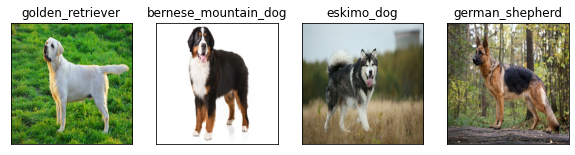

In [114]:
# Comparing custom images to predicted labels
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(1, 4, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)